<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [256]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, make_scorer
import xgboost
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 500)

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovate-able:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [257]:
# Load the data
df = pd.read_csv('./housing.csv')

import missingno as msno

## EDA and CLEANING

In [258]:
#take alook at the shape and first few rows to familiarise
print(df.shape)
df.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


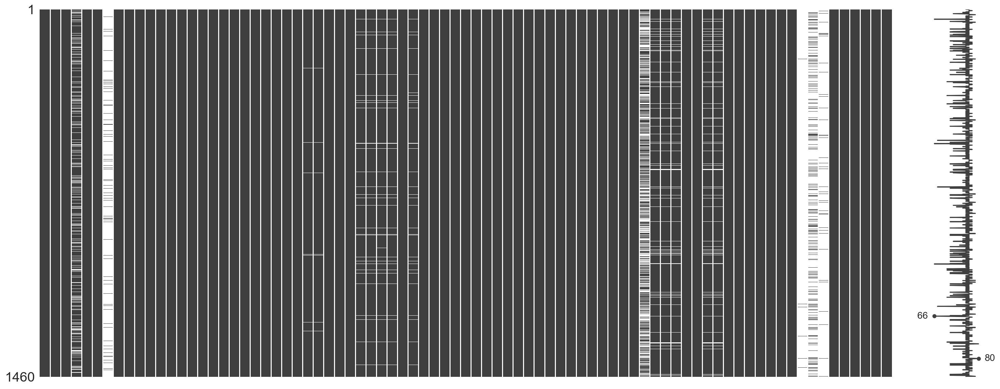

In [259]:
#Check out any missing values that will need to be dealt with 
msno.matrix(df)

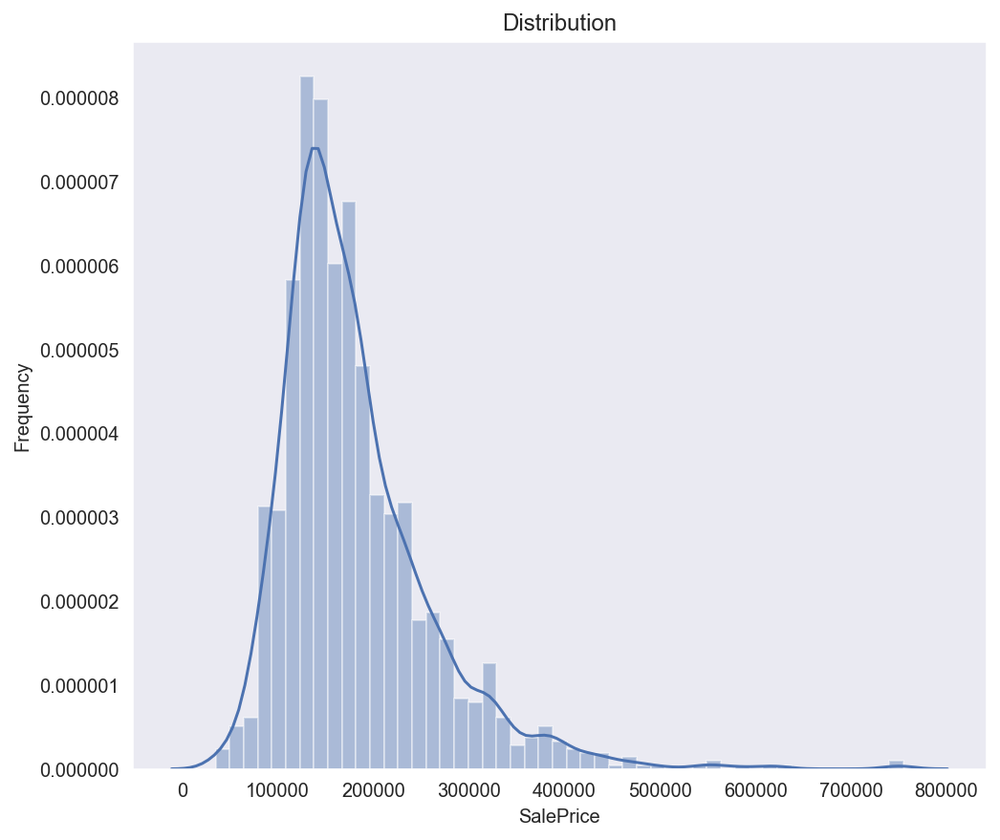

In [260]:
#Target will be Saleprice so lets take a look at its distribution
sns.set_style("dark")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 7)) 
sns.distplot(df['SalePrice'], color="b");
ax.xaxis.grid(False)
ax.set(ylabel="Frequency")
ax.set(xlabel="SalePrice")
ax.set(title="Distribution")
plt.show()
#bit of positive skew due to some outliers in highend prices

In [261]:

#Explore the target variable
print(df.SalePrice.describe())

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


In [262]:
# there are 1460 unique ids so lest drop that column
df.Id.value_counts()

1460    1
479     1
481     1
482     1
483     1
484     1
485     1
486     1
487     1
488     1
489     1
490     1
491     1
492     1
493     1
494     1
495     1
496     1
497     1
498     1
499     1
480     1
478     1
501     1
477     1
458     1
459     1
460     1
461     1
462     1
463     1
464     1
465     1
466     1
467     1
468     1
469     1
470     1
471     1
472     1
473     1
474     1
475     1
476     1
500     1
502     1
547     1
525     1
527     1
528     1
529     1
530     1
531     1
532     1
533     1
534     1
535     1
536     1
537     1
538     1
539     1
540     1
541     1
542     1
543     1
544     1
545     1
526     1
524     1
503     1
523     1
504     1
505     1
506     1
507     1
508     1
509     1
510     1
511     1
512     1
513     1
514     1
515     1
516     1
517     1
518     1
519     1
520     1
521     1
522     1
457     1
456     1
455     1
388     1
390     1
391     1
392     1
393     1
394     1
395     1


In [263]:
df.drop('Id', inplace=True, axis=1)

In [264]:
#according to the data dictionary Na represents none so lets convert that straight off
df.replace('NA','none',inplace=True)

In [265]:
#remove non residential
df.MSZoning.value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [266]:
#remove c (all)
df=df[df.MSZoning != 'C (all)']

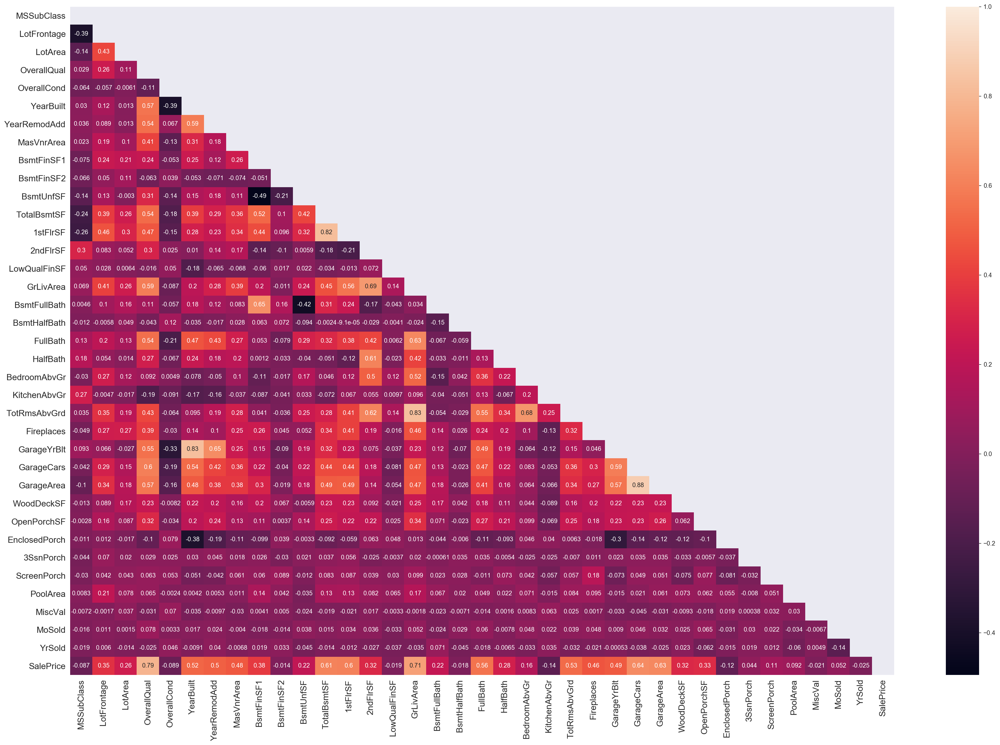

In [267]:
#We get an idea of what feaures may be of interest and what features exhibit colinearity
fig, ax = plt.subplots(figsize=(30,20))
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True


ax = sns.heatmap(df.corr(), mask=mask, ax=ax,annot=True)
sns.set_style("white")

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

plt.show()

(-0.5, 9.5, 0, 800000)

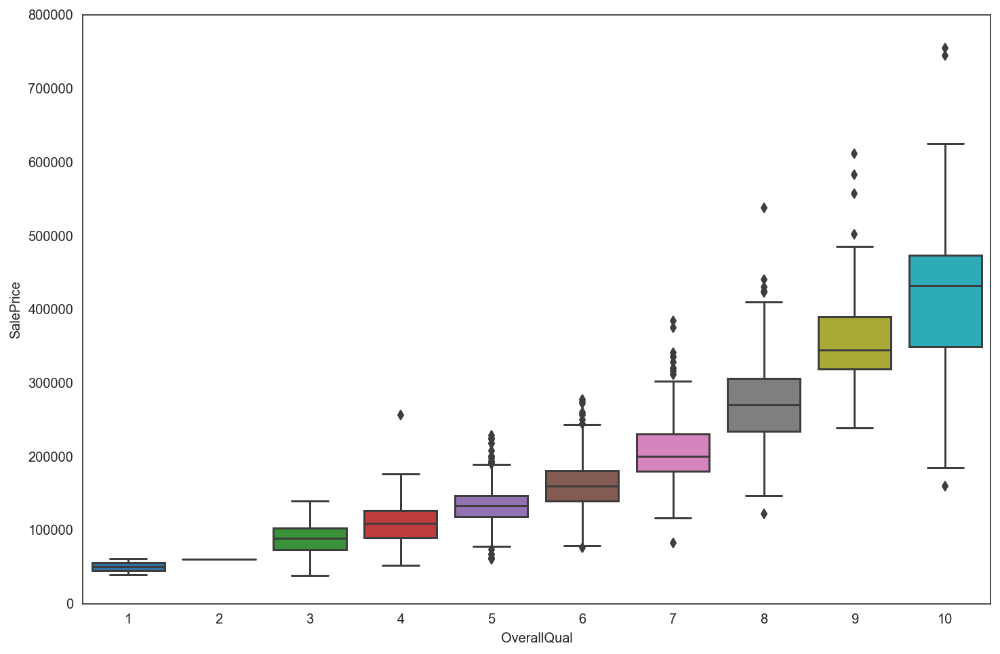

In [268]:
#high correlation between overall qual and sale price lets take a look
data = pd.concat([df['SalePrice'], df['OverallQual']], axis=1)
f, ax = plt.subplots(figsize=(12, 8))
fig = sns.boxplot(x=df['OverallQual'], y=df["SalePrice"], data=data)
fig.axis(ymin=0, ymax=800000)

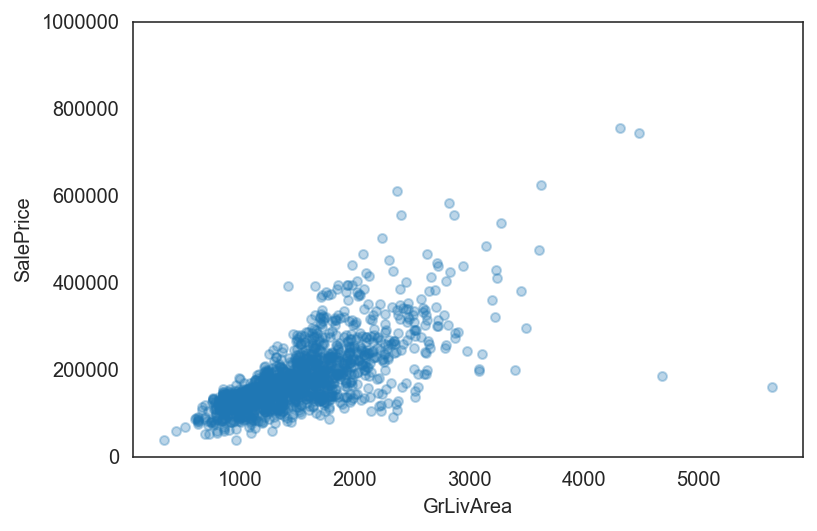

In [269]:
# Gr living area has hihg correlation plot it
data = pd.concat([df['SalePrice'], df['GrLivArea']], axis=1)
data.plot.scatter(x='GrLivArea', y='SalePrice', alpha=0.3, ylim=(0,1000000));

In [270]:
#create an age of house category with numerical relevance since the year is not continuous or ordinal
df['Age']=df['YrSold'].subtract(df['YearBuilt'])

In [271]:
#column dropping function 
def dropcol(df, cols_to_drop):
        df.drop(cols_to_drop, axis = 1, inplace = True)

In [272]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

In [273]:
#grouping columns as yes/no (0,1) indicating presence since they have high nan's but may affect price
ispres = lambda x: 1 if x > 0 else 0

porch = ['3SsnPorch','EnclosedPorch','OpenPorchSF','ScreenPorch']
df['Porch'] = df[porch].sum(axis=1).apply(lambda x: 1 if x > 0 else 0)
dropcol(df, porch)

pool = ['PoolQC','PoolArea']
df['Pool'] = df['PoolArea'].apply(ispres)
dropcol(df, pool)
    
# GARAGE
df['Garage'] = df['GarageArea'].apply(ispres)
    
# FIREPLACE
df['Fireplaces'] = df['Fireplaces'].apply(ispres)
    
# MASONRY VENEER
df['MasVnrPres'] = df['MasVnrArea'].apply(ispres)
    
# BASEMENT
df['Basement'] = df['BsmtQual'].fillna('none').apply(lambda x: 0 if x == 'none' else 1)

# LANDSLOPE
df['LandSlope'] = df['LandSlope'].apply(lambda x: 'flat' if x == 'Gtl' else 'sloped')
    
#MISCFEATURES
df['Shed'] = df['MiscFeature'].apply(lambda x: 1 if x == 'Shed' else 0)
dropcol(df, 'MiscFeature')    


In [274]:

#create a categorical data frame for ease of cleaning
cat_df=df[['MoSold','MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','YearBuilt','YearRemodAdd','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional', 'FireplaceQu','GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond','PavedDrive','Fence','SaleType','SaleCondition']]

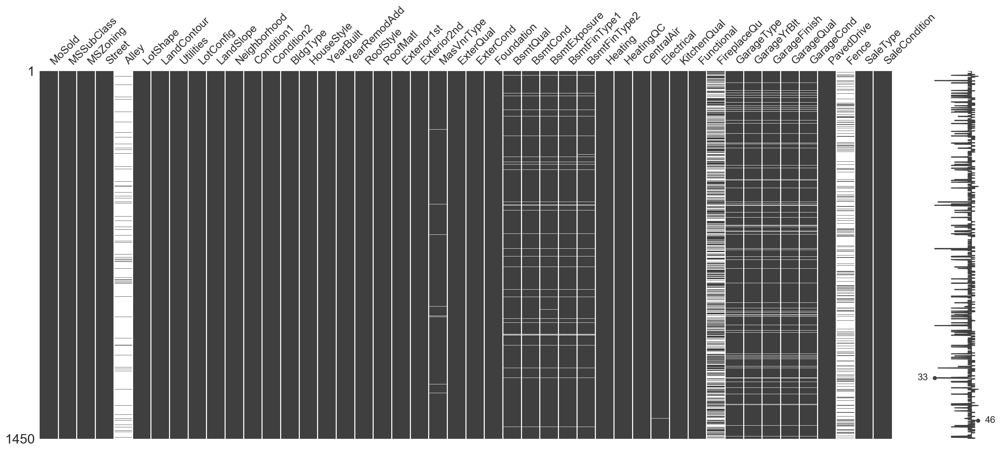

In [275]:
# Areas to Address: Alley, MasVnrtype, Basement variables, fireplacequ, garage variables, Pool, Fence, Misc Feature
msno.matrix(cat_df)

In [276]:
cat_df.Electrical.value_counts()

SBrkr    1328
FuseA      90
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [277]:
#lets impute the mode for the one electrical missing value
cat_df.Electrical=cat_df.Electrical.fillna('Sbrkr').copy()

In [278]:
cat_df.head()

,MoSold,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,2,60,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,flat,CollgCr,Norm,Norm,1Fam,2Story,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,2003.0,RFn,TA,TA,Y,NaN,WD,Normal
1,5,20,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,flat,Veenker,Feedr,Norm,1Fam,1Story,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,1976.0,RFn,TA,TA,Y,NaN,WD,Normal
2,9,60,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,flat,CollgCr,Norm,Norm,1Fam,2Story,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,2001.0,RFn,TA,TA,Y,NaN,WD,Normal
3,2,70,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,flat,Crawfor,Norm,Norm,1Fam,2Story,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,1998.0,Unf,TA,TA,Y,NaN,WD,Abnorml
4,12,60,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,flat,NoRidge,Norm,Norm,1Fam,2Story,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,2000.0,RFn,TA,TA,Y,NaN,WD,Normal


In [279]:
xd=df[['Neighborhood','SalePrice']]

In [280]:
#looking at high sale price neighborhoods 
xd.sort_values('SalePrice', ascending=False)

,Neighborhood,SalePrice
691,NoRidge,755000
1182,NoRidge,745000
1169,NoRidge,625000
898,NridgHt,611657
803,NridgHt,582933
1046,StoneBr,556581
440,NridgHt,555000
769,StoneBr,538000
178,StoneBr,501837
798,NridgHt,485000


In [281]:
df['Age'].value_counts()

1      100
0       64
4       41
2       39
3       36
31      31
5       30
6       30
8       25
37      25
7       24
51      24
39      24
9       23
32      23
47      23
10      22
11      22
42      22
49      21
15      20
36      20
53      20
30      19
43      19
48      18
54      17
41      17
45      17
12      16
44      16
59      16
38      16
50      16
46      15
13      15
33      15
40      15
52      15
34      15
29      14
14      14
89      13
81      13
84      13
83      12
16      12
58      12
70      12
69      12
68      12
35      11
17      11
57      11
60      11
88      11
87      11
56      10
55       9
18       8
86       8
73       8
67       7
22       7
26       7
25       7
93       7
78       7
19       7
77       7
62       7
96       6
21       6
91       6
65       6
97       6
66       6
90       5
24       5
94       5
80       5
85       5
82       5
28       5
20       5
61       5
27       5
92       4
76       4
99       4
23       3

In [282]:
#start dealing with some NA these ones can be filled with none as they are explainable 
cat_df.Alley.fillna('none',inplace=True)
cat_df.Fence.fillna('none',inplace=True)
cat_df.MasVnrType.fillna('none',inplace=True)
cat_df.FireplaceQu.fillna('none',inplace=True)
for col in ['GarageType','GarageFinish','GarageQual','GarageCond']:
    cat_df[col]=cat_df[col].fillna('none')
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    cat_df[col] = cat_df[col].fillna('none')

In [283]:
#we have some quality ordinal categories that we can assign numeric values to 
def mapquality(colname,dictionary):
    """function for converting quality cat to numeric"""
    cat_df[colname] = cat_df[colname].map(dictionary)

In [284]:
#dictionary for mapping onto our quality columns
quality = {'Ex': 5,
               'Gd': 4,
               'TA': 3,
               'Fa': 2,
               'Po': 1,
               'none': 0}

In [285]:
mapquality('ExterQual', dictionary = quality)
mapquality('BsmtQual', dictionary = quality)
mapquality('HeatingQC', dictionary = quality)
mapquality('KitchenQual', dictionary = quality)
mapquality('FireplaceQu', dictionary = quality)
mapquality('GarageQual',dictionary= quality)

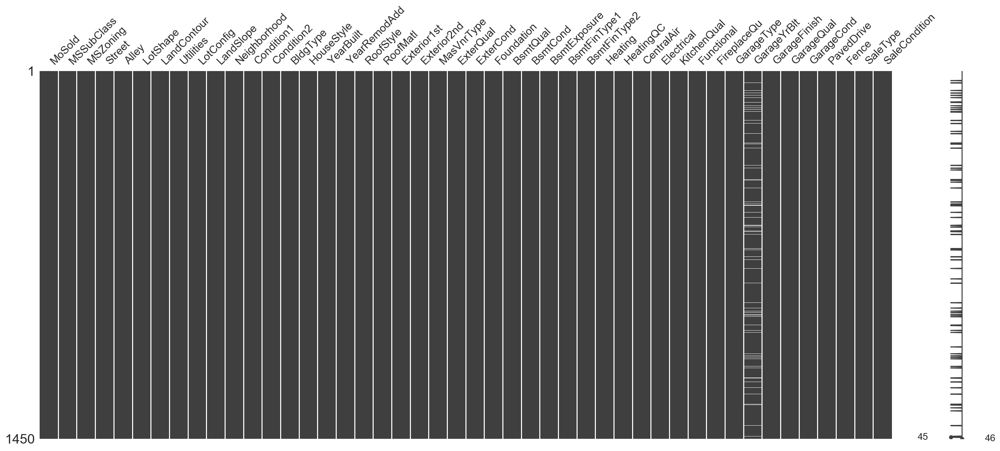

In [286]:
msno.matrix(cat_df)

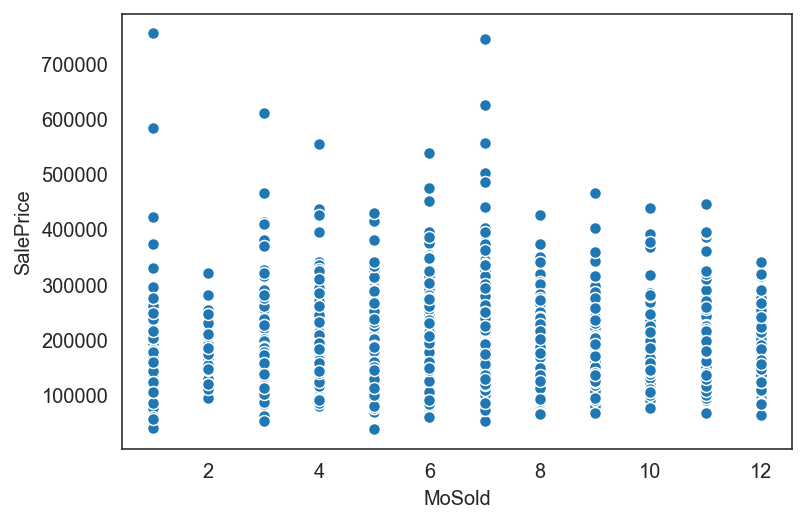

In [287]:
#In the us spring is considered the best time of year to sell a house
#maybe I should seperate months into seasons
#it appears though that month has no affect on sales price only on volume of sales which we are not interested in.


sns.scatterplot(df['MoSold'],df['SalePrice']);


In [288]:
#colinearity between garage year built and year built ao lets just drop it to avoid colinearity in our data
xd=df[['GarageYrBlt','Age']]
xd.corr()

,GarageYrBlt,Age
GarageYrBlt,1.000000,-0.828681
Age,-0.828681,1.000000


In [289]:
cat_df.drop('GarageYrBlt', axis=1, inplace=True)

In [290]:
#MSSubClass is numerical but it is a categorical variable and the numbers mean nothing
cat_df['MSSubClass'] = df['MSSubClass'].astype(str)


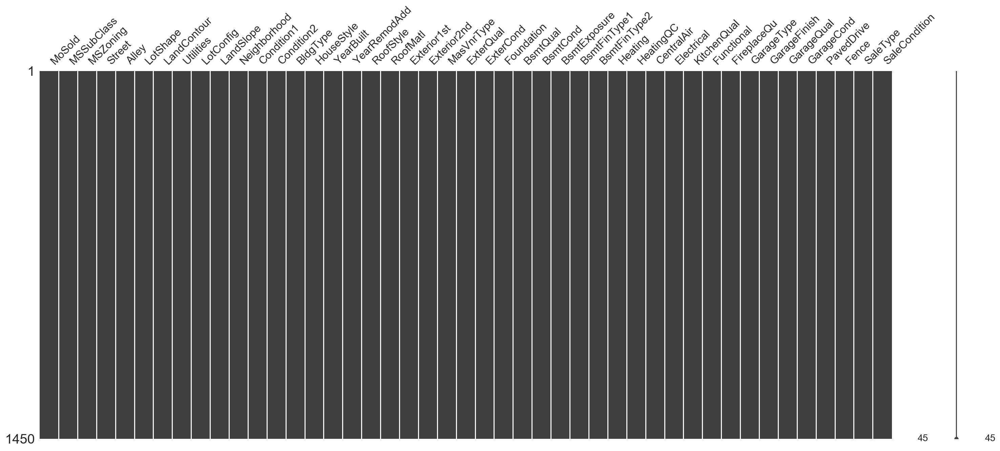

In [291]:
#categorical variables done
msno.matrix(cat_df)

In [292]:
#create an age of remodel categorical variable
cat_df['Remod/Add'] = np.array(['new' if j==i else 'less_5yrs' if ((j-i > 0) & (j-i<=5))else '6-15years' if ((j-i > 6) & (j-i <=15)) else 'over_15yrs' for i,j in df[['YearBuilt','YearRemodAdd']].values])

In [293]:
#thinking about some plotting with neighborhoods.  I was able to identify most on google maps.  I may plot them.

In [294]:
cat_df.Neighborhood.value_counts()

NAmes      225
CollgCr    150
OldTown    112
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      28
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [295]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Age,Porch,Pool,Garage,MasVnrPres,Basement,Shed
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,flat,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,NaN,0,2,2008,WD,Normal,208500,5,1,0,1,1,1,0
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,flat,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,NaN,0,5,2007,WD,Normal,181500,31,0,0,1,0,1,0
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,flat,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,NaN,0,9,2008,WD,Normal,223500,7,1,0,1,1,1,0
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,flat,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,NaN,0,2,2006,WD,Abnorml,140000,91,1,0,1,0,1,0
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,flat,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,NaN,0,12,2008,WD,Normal,250000,8,1,0,1,1,1,0


In [296]:
#quantitative features
num_df=df[['YrSold','LotFrontage','LotArea','OverallQual','OverallCond','MasVnrArea','BsmtFinSF1','BsmtFinSF2','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath','FullBath','BsmtHalfBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','GarageArea','WoodDeckSF','MiscVal','SalePrice','Porch','Pool','Garage','MasVnrPres','Basement','Shed','Age']]
print(num_df.shape)
num_df.tail()

(1450, 32)


,YrSold,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,BsmtHalfBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,MiscVal,SalePrice,Porch,Pool,Garage,MasVnrPres,Basement,Shed,Age
1455,2007,62.0,7917,6,5,0.0,0,0,953,953,694,1647,0,2,0,1,3,1,7,1,2,460,0,0,175000,1,0,1,0,1,0,8
1456,2010,85.0,13175,6,6,119.0,790,163,1542,2073,0,2073,1,2,0,0,3,1,7,1,2,500,349,0,210000,0,0,1,1,1,0,32
1457,2010,66.0,9042,7,9,0.0,275,0,1152,1188,1152,2340,0,2,0,0,4,1,9,1,1,252,0,2500,266500,1,0,1,0,1,1,69
1458,2010,68.0,9717,5,6,0.0,49,1029,1078,1078,0,1078,1,1,0,0,2,1,5,0,1,240,366,0,142125,1,0,1,0,1,0,60
1459,2008,75.0,9937,5,6,0.0,830,290,1256,1256,0,1256,1,1,0,1,3,1,6,0,1,276,736,0,147500,1,0,1,0,1,0,43


In [297]:
#Id like to treat these as categorical becuase the numerical representation is discrete and we cannot say that 4 rooms is twice teh value of 2 rooms

num_df['OverallQual']=num_df['OverallQual'].astype(str)
num_df['OverallCond'] =num_df['OverallCond'].astype(str)
num_df['BsmtFullBath']=num_df['BsmtFullBath'].astype(str)
num_df['FullBath']=num_df['FullBath'].astype(str)
num_df['BsmtHalfBath']=num_df['BsmtHalfBath'].astype(str)
num_df['HalfBath']=num_df['HalfBath'].astype(str)
num_df['BedroomAbvGr']=num_df['BedroomAbvGr'].astype(str)
num_df['KitchenAbvGr']=num_df['KitchenAbvGr'].astype(str)
num_df['TotRmsAbvGrd']=num_df['TotRmsAbvGrd'].astype(str)
num_df['Fireplaces']=num_df['Fireplaces'].astype(str)


In [298]:
num_df.OverallQual.value_counts()

5     396
6     373
7     319
8     168
4     111
9      43
10     18
3      18
1       2
2       2
Name: OverallQual, dtype: int64

In [299]:
#other columns that exhibit high colinearity need to be dropped
num_df.drop('GarageCars', axis=1, inplace=True)
num_df.drop('TotalBsmtSF',axis=1, inplace=True)

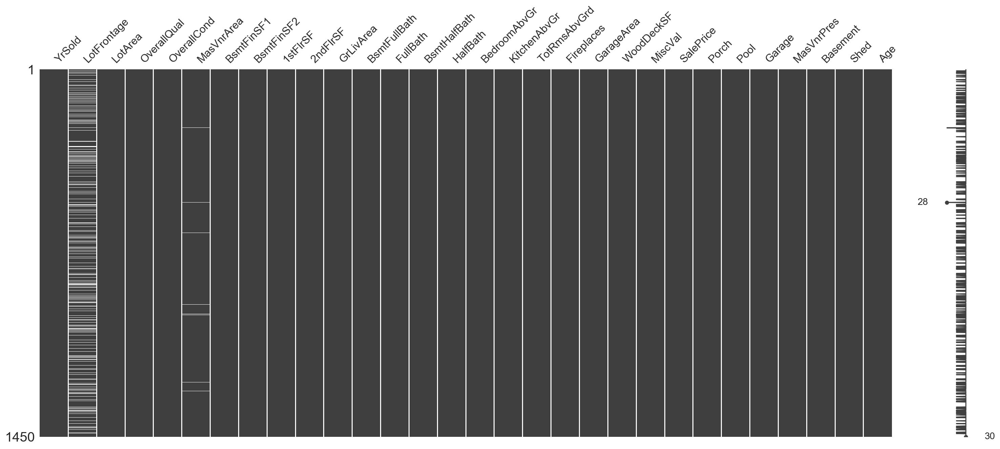

In [300]:
msno.matrix(num_df)

In [301]:
#clean lot frontage, lets impute the median since all the hosues must have some lot frontage to exist
#masonary veneer(Massvnrsqft) probably isd 0 if na but check it out
#all else is good
num_df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

In [302]:
num_df.MasVnrArea.fillna(0,inplace=True)

*columns to consider dropping after running model*


alley (93.2% null)
miscval (97% zeros)
lowqualfinsf (98% zeros)
street (99.7% single value)
utilities (99.9% single value)
condition2 (98.7% single value)
roofmatl (98.7% single value)
heating (98.4% single value)
centralair (93.1% single value)
electrical (91.1% single value)
paveddrive (90.7 single value)
fence (80.5% zeros)
saletype (86.8% single value)
bsmthalfbath (94% zeros)
bsmtfintype2 (85.3% zeros)
bsmtfinsf2 (88% zeros)
bsmtcond (89.% single value)
extercond (86.7% single value)
garagequal (89.6% single value)

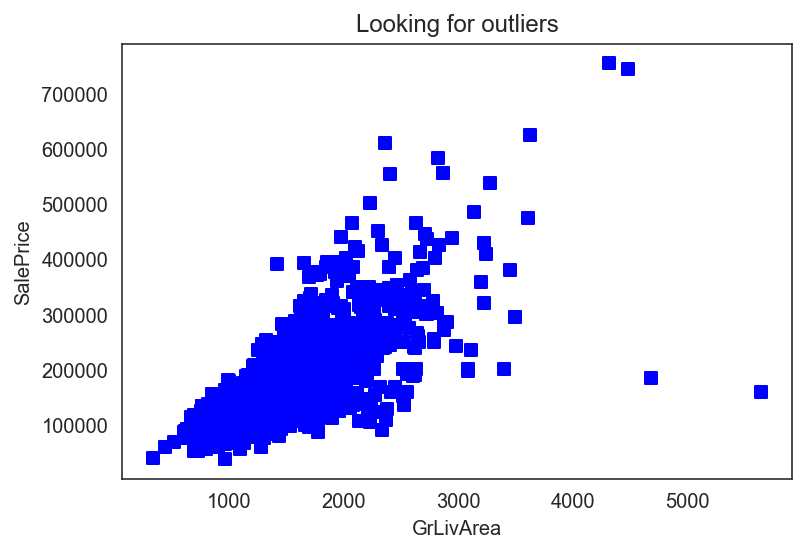

In [303]:
#outliers exploration
plt.scatter(df.GrLivArea, df.SalePrice, c = "blue", marker = "s")
plt.title("Looking for outliers")
plt.xlabel("GrLivArea")
plt.ylabel("SalePrice")
plt.show()

df2 = df[df.GrLivArea < 4000]

In [304]:
num_df.shape

(1450, 30)

In [305]:
cat_df.shape

(1450, 46)

In [306]:
#take in the numerical categorical variables as objects
cat_df['MoSold'] = cat_df['MoSold'].astype(object)

In [307]:
y_df=df['SalePrice']

In [308]:
frames=[num_df,cat_df]
new_df=pd.concat(frames, axis=1)
new_df.shape

(1450, 76)

In [309]:
#new_df.to_csv('housingclean')

## Modeling
______________________________

## Fixed features
Fixed
BsmtQual: Evaluates the height of the basement
BsmtExposure: Refers to walkout or garden level walls
TotalBsmtSF: Total square feet of basement area
Heating: Type of heating
HeatingQC: Heating quality and condition
CentralAir: Central air conditioning
Electrical: Electrical system
1stFlrSF: First Floor square feet
2ndFlrSF: Second floor square feet
GrLivArea: Above grade (ground) living area square feet
BsmtFullBath: Basement full bathrooms
BsmtHalfBath: Basement half bathrooms
FullBath: Full bathrooms above grade
HalfBath: Half baths above grade
Bedroom: Bedrooms above grade (does NOT include basement bedrooms)
Kitchen: Kitchens above grade
Fireplaces: Number of fireplaces
GarageType: Garage location
GarageYrBlt: Year garage was built
GarageCars: Size of garage in car capacity
GarageArea: Size of garage in square feet
PoolArea: Pool area in square feet
MoSold: Month Sold (MM)
YrSold: Year Sold (YYYY)
MiscFeature: Miscellaneous feature not covered in other categories
Shed or not! 2 dummies
MiscVal: $Value of miscellaneous feature
SaleType: Type of sale

In [310]:
fixed = new_df[['YrSold','LotFrontage','LotArea','BsmtQual','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageArea','Fireplaces','Basement','Age','MoSold','MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1','Condition2', 'BldgType', 'HouseStyle','Foundation','BsmtExposure','CentralAir', 'Electrical', 'Functional',
       'FireplaceQu', 'GarageType', 'GarageFinish','SaleType', 'SaleCondition', 'Remod/Add','Garage','YearBuilt','SalePrice']]

In [311]:
fixed_list = ['YrSold','LotFrontage','LotArea','BsmtQual','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageArea','Fireplaces','Basement','Age','MoSold','MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1','Condition2', 'BldgType', 'HouseStyle','Foundation','BsmtExposure','CentralAir', 'Electrical', 'Functional',
       'FireplaceQu', 'GarageType', 'GarageFinish','SaleType', 'SaleCondition', 'Remod/Add','Garage','YearBuilt','SalePrice']




In [312]:
len(fixed_list)

47

In [313]:
all_col=list(new_df.columns)
len(all_col)

76

## Here I am ensuring that my lists do not contain duyplicate features which will effect my models predictions significantly

In [314]:
def Diff(li1, li2): 
    reno_col = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return reno_col 

In [315]:
reno_list=Diff(all_col,fixed_list)

In [316]:
reno_df=new_df[['OverallQual',
'OverallCond',
'MasVnrArea',
'BsmtFinSF1',
'BsmtFinSF2',
'WoodDeckSF',
'MiscVal',
'Porch',
'Pool',
'MasVnrPres',
'Shed',
'YearRemodAdd',
'RoofStyle',
'RoofMatl',
'Exterior1st',
'Exterior2nd',
'MasVnrType',
'ExterQual',
'ExterCond',
'BsmtCond',
'BsmtFinType1',
'BsmtFinType2',
'Heating',
'HeatingQC',
'KitchenQual',
'GarageQual',
'GarageCond',
'PavedDrive',
'Fence',
'YrSold',
'SalePrice']]

In [317]:
reno_df.shape

(1450, 31)

In [318]:
def checkIfDuplicates_2(listOfElems):
    ''' Check if my list contains any duplicates '''    
    setOfElems = set()
    for elem in listOfElems:
        if elem in setOfElems:
            return elem
        else:
            setOfElems.add(elem)         
    return False

In [319]:
lst2=list(fixed.columns)

In [320]:
checkIfDuplicates_2(list(fixed.columns))

False

In [321]:
checkIfDuplicates_2(list(reno_list))

False

## Everything is in order, I will begin modelling 

In [322]:
#creating dummmies for the categorical features
fixed_dummies =pd.get_dummies(fixed, drop_first =True)

In [323]:
reno_dummies=pd.get_dummies(reno_df,drop_first=True)

In [324]:
X_train=fixed_dummies.loc[fixed_dummies['YrSold']!=2010]
y_train=X_train['SalePrice']

In [325]:
X_train_reno=reno_dummies.loc[reno_dummies['YrSold']!=2010]
y_train_reno=X_train_reno['SalePrice']

In [326]:
print(X_train.shape)
print(y_train.shape)
print(X_train_reno.shape)
print(y_train_reno.shape)

(1278, 185)
(1278,)
(1278, 114)
(1278,)


In [327]:
X_test=fixed_dummies.loc[fixed_dummies['YrSold']==2010]
y_test=X_test['SalePrice']
X_test_reno=reno_dummies.loc[reno_dummies['YrSold']==2010]
y_test_reno=X_test_reno['SalePrice']

In [328]:
print(X_test.shape)
print(y_test.shape)
print(X_test_reno.shape)
print(y_test_reno.shape)

(172, 185)
(172,)
(172, 114)
(172,)


In [329]:
X_test.head()

,YrSold,LotFrontage,LotArea,BsmtQual,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,Basement,Age,FireplaceQu,Garage,YearBuilt,SalePrice,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,FullBath_1,FullBath_2,FullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_sloped,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_Sbrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Remod/Add_less_5yrs,Remod/Add_new,Remod/Add_over_15yrs
16,2010,73.0,11241,3,1004,0,1004,480,1,40,3,1,1970,149000,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0
24,2010,71.0,8246,3,1060,0,1060,270,1,42,3,1,1968,154000,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1
26,2010,60.0,7200,3,900,0,900,576,1,59,0,1,1951,134800,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1

In [330]:
y_test.head()

16    149000
24    154000
26    134800
27    306000
33    165500
Name: SalePrice, dtype: int64

In [331]:
X_test.drop(('SalePrice'),axis=1,inplace=True)
X_test.drop(('YrSold'),axis=1,inplace=True)

In [332]:

X_train.drop(('SalePrice'),axis=1,inplace=True)
X_train.drop(('YrSold'),axis=1,inplace=True)

In [333]:
X_test_reno.drop(('SalePrice'),axis=1,inplace=True)
X_test_reno.drop(('YrSold'),axis=1,inplace=True)
X_train_reno.drop(('SalePrice'),axis=1,inplace=True)
X_train_reno.drop(('YrSold'),axis=1,inplace=True)

## Simple LInear reg

In [334]:
scaler = StandardScaler()

Xs_train = scaler.fit_transform(X_train)
Xs_test = scaler.transform(X_test)

In [335]:

# Fit Linear Regression model on training data and evaluate on test data
lnr = LinearRegression()
lnr.fit(Xs_train, y_train)
print(f'R2 score on training data: {round(lnr.score(Xs_train, y_train),3)}')
print(f'R2 score on test data: {round(lnr.score(Xs_test, y_test),3)}')

R2 score on training data: 0.869
R2 score on test data: 0.841


In [336]:
print(f'Intercept: {lnr.intercept_}')
print(f'\nRange of Coefficients: {[min(lnr.coef_), max(lnr.coef_)]}')

Intercept: 181985.60603703454

Range of Coefficients: [-2.2157247242202355e+17, 8.499352940877194e+16]


In [337]:
# Calculate RMSE
y_pred = lnr.predict(Xs_test)

print(f'Root Mean Square Error of model on test data is: \
${int(mean_squared_error(y_test,y_pred)**0.5)}')

print(f'Root Mean Square Error of model on train data is: \
${int(mean_squared_error(y_train, lnr.predict(Xs_train))**0.5)}')

Root Mean Square Error of model on test data is: $31783
Root Mean Square Error of model on train data is: $28578


In [338]:
#function to plot predictions vs actuals

def plot_yhat(y_test, y_pred):
    '''This function accepts 2 series and plots a scatter plot of y vs ypred.
    The function also plots an x=y line to demonstrate the 'perfect model', 
    where y = yhat'''

    plt.figure(figsize=(5,5))

    plt.scatter(y_test, y_pred, color='mediumorchid', s=4, label='Predicted vs. Actual', alpha=0.7 )

    max_val = np.max(y_test)
    plt.plot([0, max_val*1.05], [0, max_val*1.05], color='navy',
            linewidth=2.0, alpha=0.5, label='Perfect model', )
    
   
    plt.grid(color='lightgrey', linewidth=0.7, linestyle='--')
    
    plt.xlabel('Actual Sale Price ($)')
    plt.xlim(0,max_val*1.05)

    plt.ylabel('Predicted Sale Price ($)')
    plt.ylim(0,max_val*1.05)
    
    plt.title('Plot of predicted values vs. actual values')
    plt.legend() 
    plt.show()

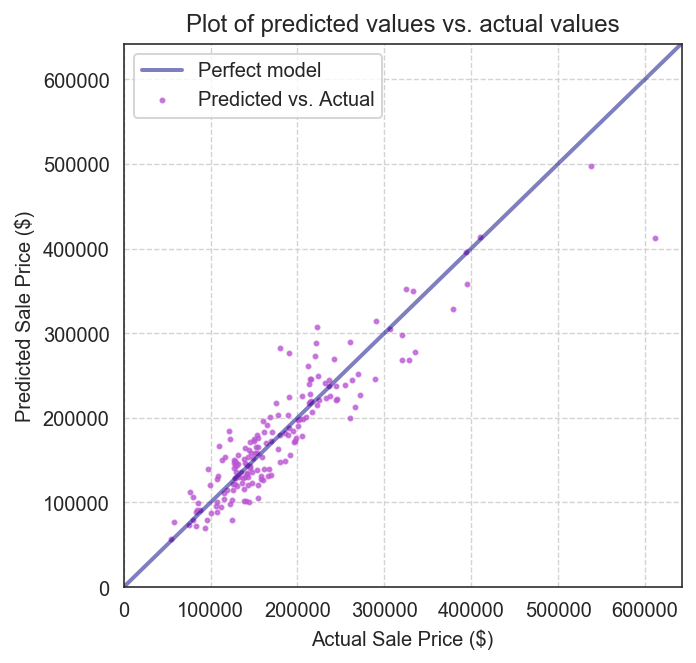

In [339]:
# a few outliers causing issues at the high end of sales price
plot_yhat(y_test, y_pred)

In [340]:
residuals_train=y_train-lnr.predict(X_train)
residuals_test=y_test-lnr.predict(X_test)

In [341]:
# Display 10 largest model residuals to have a look at that outlier
df_res = pd.DataFrame({'Actual':y_test,'Prediction':lnr.predict(Xs_test)})
df_res['Residual'] = df_res['Actual'] - df_res['Prediction']
df_res.sort_values('Residual', inplace=True, ascending=False)
df_res.head(100)

,Actual,Prediction,Residual
898,611657,412153.466366,199503.533634
1270,260000,199926.806078,60073.193922
1065,328000,268479.054176,59520.945824
1310,335000,277488.009825,57511.990175
1457,266500,212904.009825,53595.990175
45,319900,268470.806078,51429.193922
1267,378500,328727.054176,49772.945824
910,154300,105118.806078,49181.193922
539,272000,226719.054176,45280.945824
228,125000,79798.806078,45201.193922


## Xgboost regressor

In [342]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [343]:
#booster gblinear is the only one that allows coefs_ but it produces a less accurate score than the gbtree
xgbr = xgb.XGBRegressor(learning_rate=0.01,
                       n_estimators=6000,
                       max_depth=4,
                       min_child_weight=0,
                        booster ='gblinear',
                       gamma=0.6,
                       subsample=0.7,
                       colsample_bytree=0.7,
                       objective='reg:squarederror',
                       nthread=-1,
                       scale_pos_weight=1,
                       seed=27,
                       reg_alpha=0.00006,
                       random_state=42) 
print(xgbr)


XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.6,
             importance_type='gain', learning_rate=0.01, max_delta_step=0,
             max_depth=4, min_child_weight=0, missing=None, n_estimators=6000,
             n_jobs=1, nthread=-1, objective='reg:squarederror',
             random_state=42, reg_alpha=6e-05, reg_lambda=1, scale_pos_weight=1,
             seed=27, silent=None, subsample=0.7, verbosity=1)


In [344]:
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.6,
             importance_type='gain', learning_rate=0.01, max_delta_step=0,
             max_depth=4, min_child_weight=0, missing=None, n_estimators=6000,
             n_jobs=1, nthread=-1, objective='reg:squarederror',
             random_state=42, reg_alpha=6e-05, reg_lambda=1, scale_pos_weight=1,
             seed=27, silent=None, subsample=0.7, verbosity=1)

In [345]:
score = xgbr.score(X_train, y_train) 
score_test= xgbr.score(X_test,y_test)
print("Training score: ", score)
print("Testing score: ", score_test)

Training score:  0.7529586119973309
Testing score:  0.7756224869006734


In [346]:
scores = cross_val_score(xgbr, X_train, y_train,cv=5)
print("Mean cross-validation score: %.2f" % scores.mean())

Mean cross-validation score: 0.74


In [347]:
# kfold = KFold(n_splits=10, shuffle=True)
# kf_cv_scores = cross_val_score(xgbr, X_train, y_train, cv=kfold )
# print("K-fold CV average score: %.2f" % kf_cv_scores.mean())


In [348]:
y_pred = xgbr.predict(X_test)

In [349]:
print("R^2: {}".format(xgbr.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.7756224869006734
Root Mean Squared Error: 37768.470982169856


In [350]:
print(f'RMSE on test: ${int(mean_squared_error(y_test, y_pred)**.5)}')

RMSE on test: $37768


In [351]:
print(xgbr.intercept_)

[9372.14]


In [352]:
# inverse_preds=scaler.inverse_transform(y_pred)
# inverse_test=scaler.inverse_transform(ys_test)
# pred_df=pd.DataFrame(inverse_preds,columns=['Predictions'])
# y_test_df=pd.DataFrame(inverse_test,columns=['y_test'])
y_test_df=pd.DataFrame(y_test,columns=['SalePrice'])
y_test_df['Predictions']=y_pred
y_test_df['Residual']=y_test_df['SalePrice'].subtract(y_test_df['Predictions'])

print(X_test.shape)
print(y_test_df.shape)
y_test_df.head(45)

(172, 183)
(172, 3)


,SalePrice,Predictions,Residual
16,149000,147516.906250,1483.093750
24,154000,137986.921875,16013.078125
26,134800,117075.929688,17724.070312
27,306000,266357.187500,39642.812500
33,165500,198244.281250,-32744.281250
38,109000,111579.476562,-2579.476562
45,319900,253749.609375,66150.390625
52,110000,117450.250000,-7450.250000
63,140000,141081.343750,-1081.343750
66,180000,269379.937500,-89379.937500


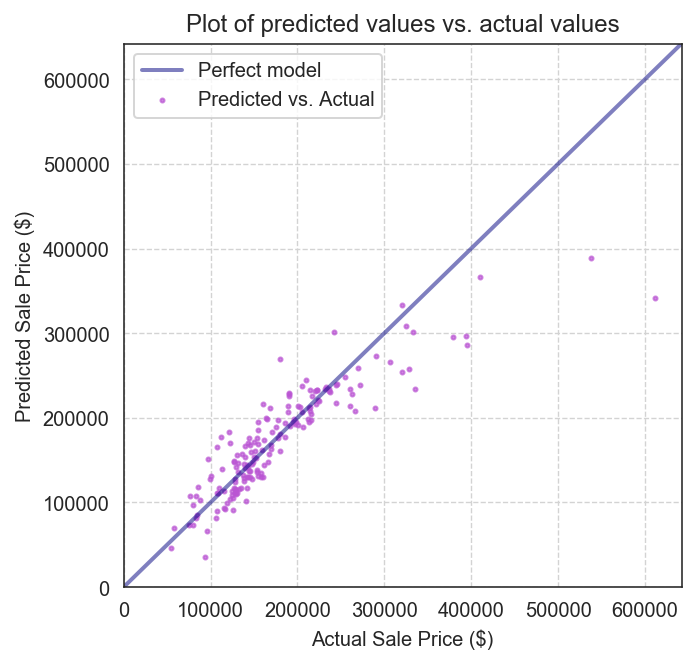

In [353]:
plot_yhat(y_test, y_pred)

In [354]:
y_test_df.head()

,SalePrice,Predictions,Residual
16,149000,147516.906250,1483.093750
24,154000,137986.921875,16013.078125
26,134800,117075.929688,17724.070312
27,306000,266357.187500,39642.812500
33,165500,198244.281250,-32744.281250


In [355]:
df_coeffs = pd.DataFrame(xgbr.coef_,index=X_train.columns, columns=['Betas'])
df_coeffs=df_coeffs.Betas.sort_values(ascending=False)
Coeff_df=pd.DataFrame(df_coeffs)
Coeff_df.reset_index(inplace=True)



In [356]:
Coeff_df.rename(columns={'index':'Feature'},inplace=True)

In [357]:
Coeff_df.head(25)

,Feature,Betas
0,BsmtQual,5399.490
1,FireplaceQu,4037.560
2,BsmtFullBath_1,2504.520
3,Neighborhood_NridgHt,2086.160
4,BsmtExposure_Gd,1866.580
5,Functional_Typ,1623.110
6,Condition1_Norm,1604.210
7,Foundation_PConc,1579.990
8,SaleType_New,1322.750
9,Remod/Add_over_15yrs,1309.090


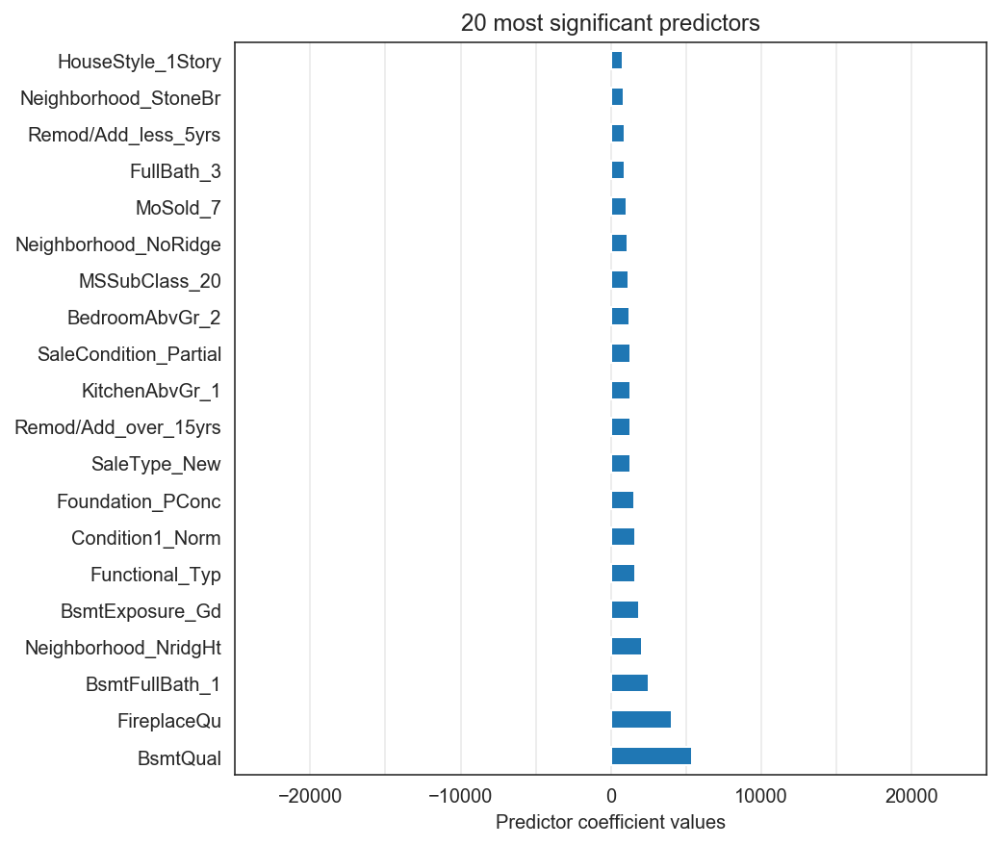

In [358]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(7,7))
title = '20 most significant predictors'
Coeff_df['Betas'][:20].plot(kind='barh', ax=ax)
ax.set_yticklabels(Coeff_df['Feature'][:20].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 5000), minor=True)
plt.show()

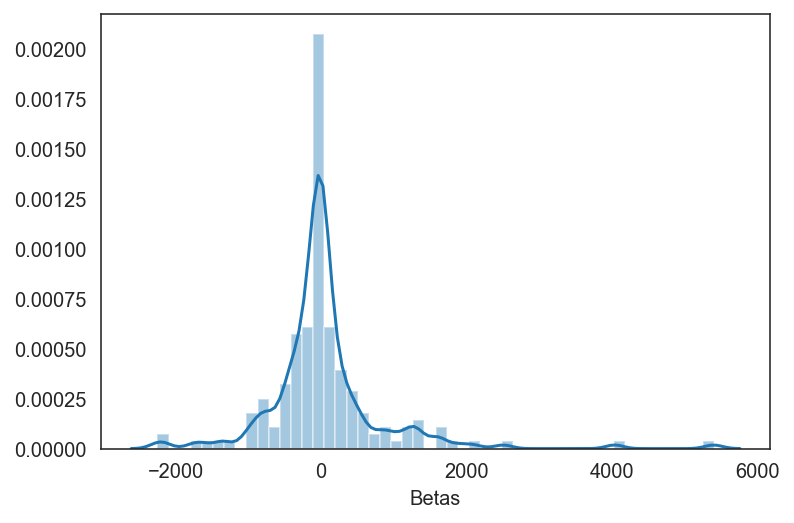

In [359]:
#distribution of the coeffs 
sns.distplot(Coeff_df['Betas'])

## With normalisation


In [360]:
xgbr.fit(Xs_train, y_train)

XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0.6,
             importance_type='gain', learning_rate=0.01, max_delta_step=0,
             max_depth=4, min_child_weight=0, missing=None, n_estimators=6000,
             n_jobs=1, nthread=-1, objective='reg:squarederror',
             random_state=42, reg_alpha=6e-05, reg_lambda=1, scale_pos_weight=1,
             seed=27, silent=None, subsample=0.7, verbosity=1)

In [361]:
score = xgbr.score(Xs_train, y_train) 
score_test= xgbr.score(Xs_test,y_test)
print("Training score: ", score)
print("Testing score: ", score_test)

Training score:  0.8142978959422452
Testing score:  0.8162692440283783


In [362]:
y_pred = xgbr.predict(Xs_test)

In [363]:
print("R^2: {}".format(xgbr.score(Xs_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.8162692440283783
Root Mean Squared Error: 34176.742721624134


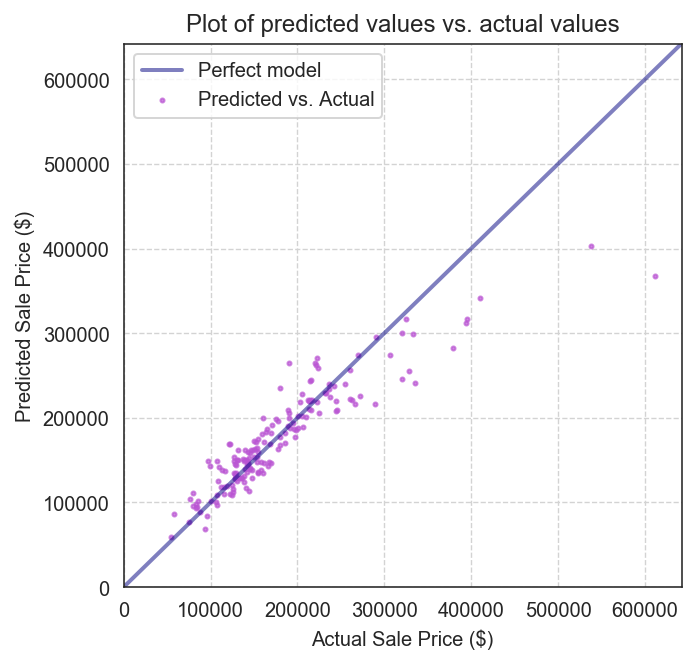

In [364]:
plot_yhat(y_test, y_pred)

## With Grid search

In [365]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.linear_model import Lasso 
  
from sklearn.svm import SVR

from xgboost import XGBRegressor

# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

# Misc
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge

In [366]:
params = {'min_child_weight':[4,5], 'gamma':[i/10.0 for i in range(3,6)],  'subsample':[i/10.0 for i in range(6,11)],
'colsample_bytree':[i/10.0 for i in range(6,11)], 'max_depth': [2,3,4]}

In [367]:
xgb = XGBRegressor(nthread=-1)

In [368]:
from sklearn.metrics import r2_score

In [369]:
grid = GridSearchCV(xgb, params)
grid.fit(Xs_train, y_train)


[13:06:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:06:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:06:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:07:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:07:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:07:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:51] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:07:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:08:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:08:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:08:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:09:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:09:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:09:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:10:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:11] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:10:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:10:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:10:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:11:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:11:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:12:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:12:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:12:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:12:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:13:12] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:13:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:13:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:14:02] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:03] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:14:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:14:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:53] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:55] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:14:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:15:20] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:21] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:15:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:41] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:15:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:16:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:07] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:16:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:32] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:33] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:16:56] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:57] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:58] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:16:59] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:17:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:22] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:24] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:17:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:17:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:18:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:14] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:15] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

[13:18:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:35] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:18:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

GridSearchCV(cv=None, error_score=nan,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0,
                                    importance_type='gain', learning_rate=0.1,
                                    max_delta_step=0, max_depth=3,
                                    min_child_weight=1, missing=None,
                                    n_estimators=100, n_jobs=1, nthread=-1,
                                    objective='reg:linear', random_state=0,
                                    reg_alpha=0, reg_lambda=1,
                                    scale_pos_weight=1, seed=None, silent=None,
                                    subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
                         'gamma': [0.3, 0.4, 0.5], 'max_dep

In [370]:
y_pred = grid.best_estimator_.predict(Xs_test)

In [371]:
print("R^2: {}".format(grid.score(Xs_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.9018673008633086
Root Mean Squared Error: 24977.364420367427


In [372]:
#max depth could indicate overfit here, will need to test on validation set.
grid.best_params_

{'colsample_bytree': 0.9,
 'gamma': 0.3,
 'max_depth': 4,
 'min_child_weight': 4,
 'subsample': 0.7}

In [373]:
y_test_df=pd.DataFrame(y_test,columns=['SalePrice'])
y_test_df['Predictions']=y_pred
y_test_df['Residual']=y_test_df['SalePrice'].subtract(y_test_df['Predictions'])

In [374]:
y_test_df

,SalePrice,Predictions,Residual
16,149000,147044.984375,1955.015625
24,154000,142688.484375,11311.515625
26,134800,122403.015625,12396.984375
27,306000,312213.875000,-6213.875000
33,165500,168521.312500,-3021.312500
38,109000,124286.632812,-15286.632812
45,319900,276542.625000,43357.375000
52,110000,107914.031250,2085.968750
63,140000,141383.375000,-1383.375000
66,180000,258105.171875,-78105.171875


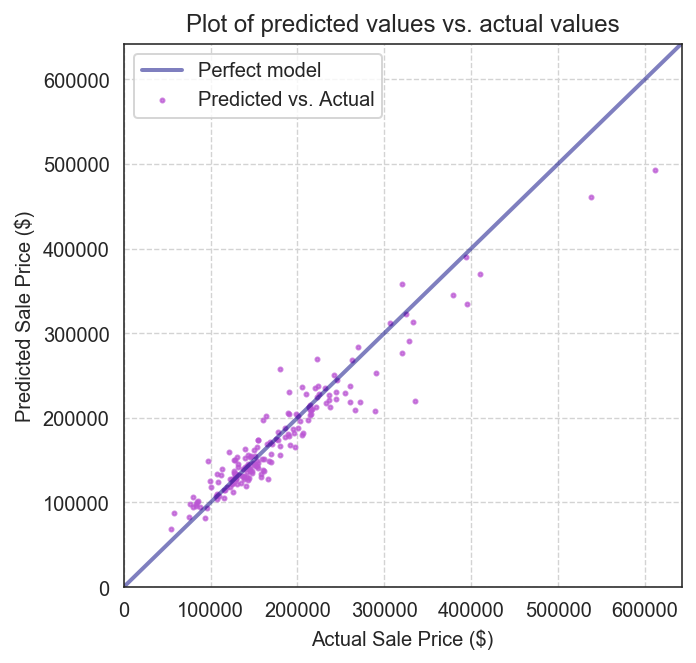

In [375]:
plot_yhat(y_test, y_pred)

## Ridge regressor and Grid search

In [376]:
#scoring function
def cv_rmse(model, X=X_train):
    rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring="neg_mean_squared_error", cv=kfold))
    return (rmse)

In [377]:
#define parameters for a grid search
param_ridge = {
    'alpha':[1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100],
    'solver':['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    "fit_intercept": [True, False]
}

In [378]:
scaler = StandardScaler()

Xs_train = scaler.fit_transform(X_train)
Xs_test = scaler.transform(X_test)

In [379]:
RGV=Ridge()

In [380]:

from sklearn.model_selection import GridSearchCV

Ridge_GS = GridSearchCV(RGV, param_grid=param_ridge, n_jobs=-1)
Ridge_GS.fit(Xs_train,y_train)
Ridge_GS.best_params_

{'alpha': 100, 'fit_intercept': True, 'solver': 'saga'}

In [381]:
Ridgeregression = Ridge(random_state=3, **Ridge_GS.best_params_)
all_r2 = cross_val_score(estimator=Ridgeregression, X=Xs_train, y=y_train, cv=5)
all_r2

array([0.82212127, 0.76691879, 0.80488479, 0.83964143, 0.65612584])

In [382]:
print('R squared: ', all_r2.mean())

R squared:  0.777938424349754


In [383]:
Ridgeregression.fit(Xs_train,y_train)
Ridgeregression.score(Xs_test,y_test)

0.8502745456226666

In [385]:
df_ridge_coeffs = pd.DataFrame(Ridgeregression.coef_,index=X_train.columns)
# df_ridge_coeffs=df_coeffs.Betas.sort_values(ascending=False)
Coeff_df_ridge=pd.DataFrame(df_ridge_coeffs)
Coeff_df_ridge.reset_index(inplace=True)

In [386]:
Coeff_df_ridge.rename(columns={'index':'Feature',0:'Betas'},inplace=True)

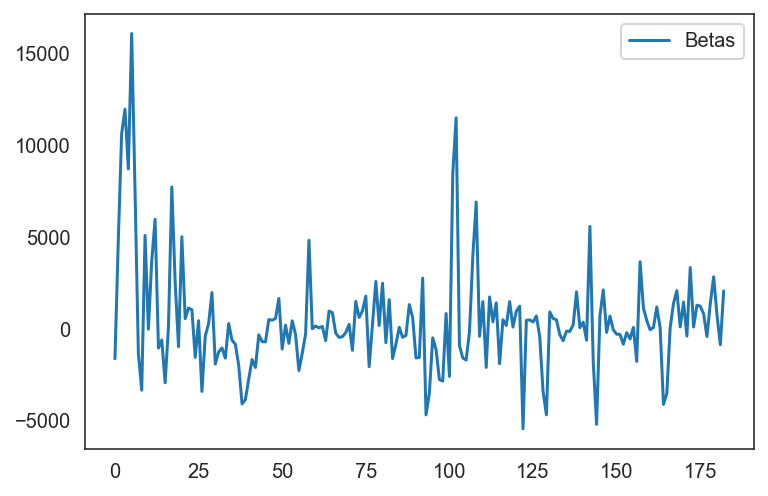

In [387]:
#dist of coefs
Coeff_df_ridge.plot()

In [388]:
Coeff_df_ridge.shape

(183, 2)

## Plotting the impact of Regularization on the coefs
   ### as the alpha increases we see its effect on the relative coef for all of our features

In [389]:
import cufflinks as cf
cf.go_offline()
import plotly.express as px

In [390]:
import matplotlib.pyplot as plt
import numpy as np


In [391]:
clf = Ridge()
coefs = []
errors = []
alphas = np.logspace(-6, 6, 200)

In [392]:


# Train the model with different regularisation strengths
for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(Xs_train, y_train)
    coefs.append(clf.coef_)
    errors.append(mean_squared_error(clf.coef_[:172], y_test))

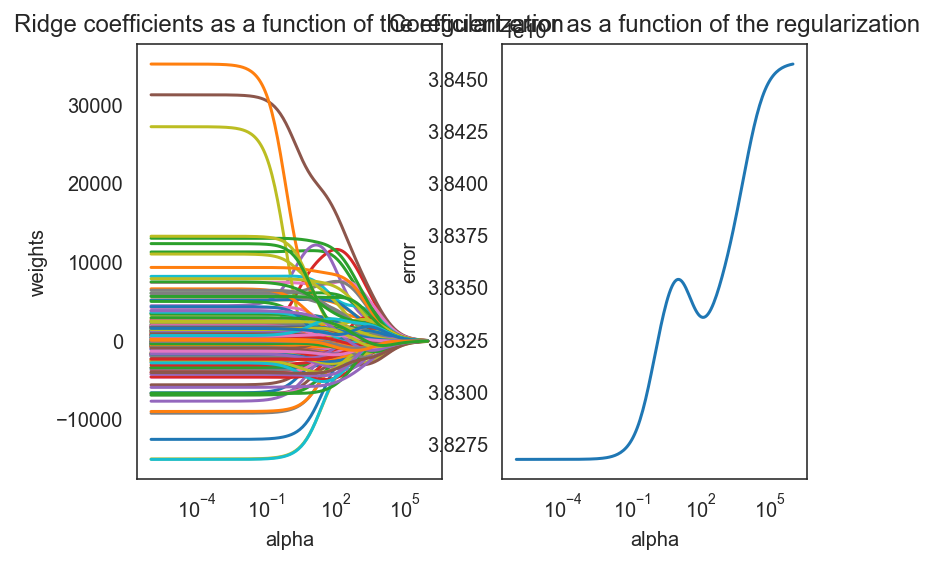

In [393]:
plt.subplot(121)
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')

plt.subplot(122)

ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.show()

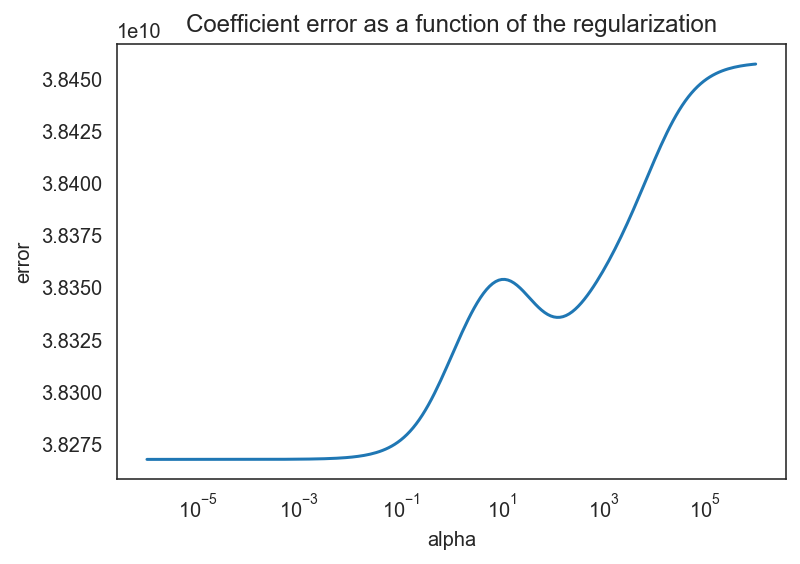

In [394]:
ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.show()

In [395]:
len(coefs)

200

In [396]:
X_train.shape

(1278, 183)

In [397]:
coefs_a=np.array(coefs)
frames= [coefs, errors, alphas]
coef_df_p=pd.DataFrame(coefs_a)
xcol=list(X_train.columns)
co_col=list(coef_df_p.columns)
my_dict=dict(zip(co_col,xcol))
coef_df_p.rename(columns=my_dict,inplace=True)
coef_df_p.shape

(200, 183)

In [398]:
coef_df_p

,LotFrontage,LotArea,BsmtQual,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,Basement,Age,FireplaceQu,Garage,YearBuilt,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,FullBath_1,FullBath_2,FullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,TotRmsAbvGrd_2,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,Fireplaces_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Pave,Alley_none,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_sloped,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_Sbrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Remod/Add_less_5yrs,Remod/Add_new,Remod/Add_over_15yrs
0,-3493.915096,5218.490678,11318.547607,1013.615924,4481.308594,31313.094956,7459.189585,-3667.150614,27256.507792,8218.498877,-1942.173346,35224.184560,6097.242879,-1709.444419,-732.676557,-6669.169663,-4606.658047,6079.393659,2888.320606,-1626.385354,5201.730979,848.163431,-311.011287,-3378.114871,-7651.555540,-5572.826471,-6837.884486,-2724.318587,-488.837813,-2461.887821,-6591.529231,-2546.989138,-3368.409909,-3057.454754,-488.838025,-1544.011701,-4197.991460,-9180.992093,-14999.642431,-15055.382106,-12508.904549,-8962.156374,-6876.902889,-4558.205591,-459.707305,-3.724496,1019.339893,1297.608589,1635.819410,2479.171150,-744.790840,501.712214,-348.873641,895.550612,167.016456,-1632.401955,-1765.003950,-1526.726411,11063.750824,3562.519346,447.151858,1210.086647,5035.902742,2668.668631,3864.399838,1858.172452,2389.710127,786.381152,778.782451,-45.654300,425.823640,4.367018,1115.636632,153.934378,702.752422,1851.817759,-1751.761997,792.988290,3320.063317,666.378445,3463.656909,-681.557601,1168.672802,-1774.535115,-1075.927061,-110.318473,-459.997440,-280.119046,1785.680421,1367.223669,-1023.280381,-249.618503,3479.845776,-3946.419649,-1888.489862,-435.616291

In [399]:
fig=px.line(coef_df_p,title="Ridge coefficients as a function of the regularization",labels={"value": "COEF", "variable": "FEATURE","index":"ALPHA"})
fig.show()
fig.write_html("PLOTLYRIDGE.html")

## Lasso regression

In [400]:
model = Lasso()

In [401]:
params={
    "alpha":[1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100],
    "normalize":[True,False],
    }
lasso_grid = GridSearchCV(model, params, cv=10)

In [402]:
lasso_grid.fit(Xs_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.0009, 0.0007, 0.0005,
                                   0.0003, 0.0001, 0.001, 0.05, 0.01, 0.1, 0.3,
                                   1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100],
                         'normalize': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [403]:
lasso_grid.best_params_

{'alpha': 50, 'normalize': True}

In [404]:
Lassoregression = Lasso(random_state=3, **lasso_grid.best_params_)
all_r2 = cross_val_score(estimator=Lassoregression, X=Xs_train, y=y_train, cv=5)
all_r2

array([0.8384495 , 0.77916959, 0.79827626, 0.85346184, 0.67402116])

In [405]:
Lassoregression.fit(Xs_train,y_train)
Lassoregression.score(Xs_test,y_test)

0.8389956757524217

In [406]:
coef_lasso=pd.DataFrame(Lassoregression.coef_)

In [407]:
coef_lasso.rename(columns={0:"coef"}, inplace=True)

In [408]:
#Lasso will zero out many of the features 
coef_lasso['feature']=X_test.columns
coef_lasso_clean=coef_lasso.loc[coef_lasso['coef'] !=0]

In [409]:
# we can see that the neighborhood of Northridge and the size of the GrLiv Area had the greatest affect on our line of fit
coef_lasso_clean.head(25)

,coef,feature
1,2091.960376,LotArea
2,10572.991134,BsmtQual
3,4318.577578,1stFlrSF
5,31041.718914,GrLivArea
6,8222.050991,GarageArea
9,5848.774055,FireplaceQu
11,5776.657661,YearBuilt
12,3794.839394,BsmtFullBath_1
17,5887.687457,FullBath_3
20,1215.040935,HalfBath_1


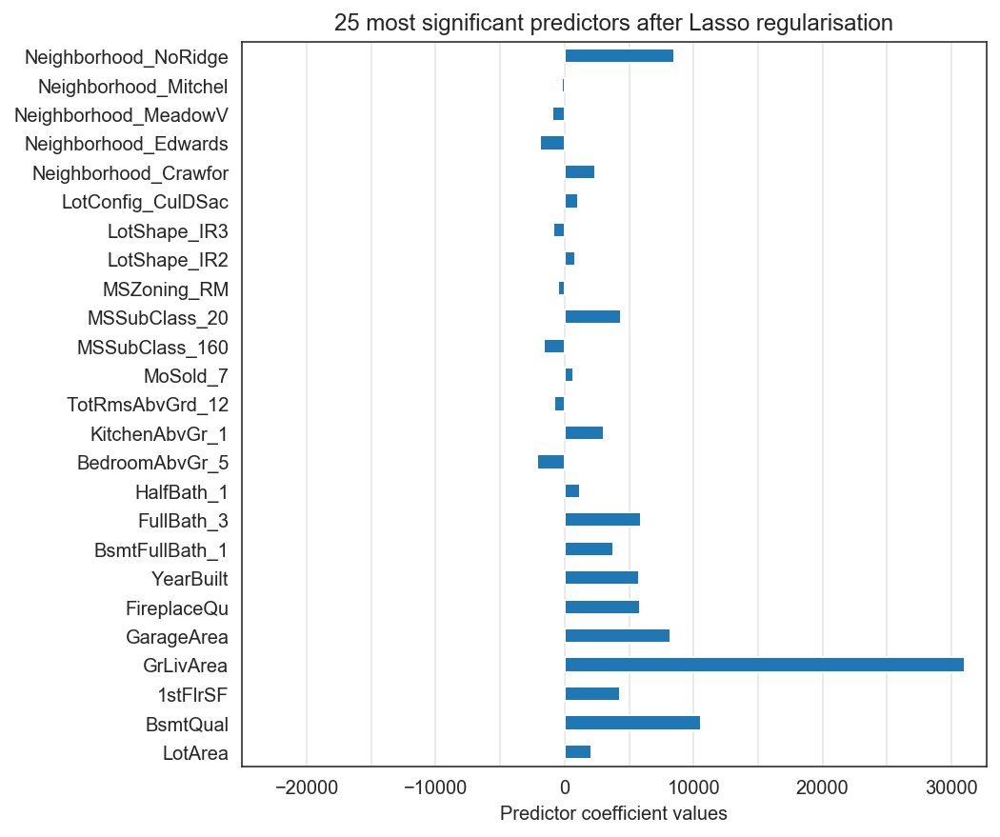

In [410]:
fig, ax = plt.subplots(figsize=(7,7))
title = '25 most significant predictors after Lasso regularisation'
coef_lasso_clean.coef[:25].plot(kind='barh', ax=ax)
ax.set_yticklabels(coef_lasso_clean.feature[:25].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 5000), minor=True)
plt.show()

## random forest regressor

In [411]:
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

In [414]:
rf.fit(Xs_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=15, max_features=None, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=5,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=1200, n_jobs=None, oob_score=True,
                      random_state=42, verbose=0, warm_start=False)

In [415]:
rf.score(Xs_test,y_test)

0.8499202482885333

In [416]:
residual_test = y_test-rf.predict(Xs_test)
residual_test.mean()

3205.026228289494

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovate-able features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

In [417]:
scaler = StandardScaler()

Xs_train_reno = scaler.fit_transform(X_train_reno)
Xs_test_reno = scaler.transform(X_test_reno)

In [418]:
df_res


,Actual,Prediction,Residual
898,611657,412153.466366,199503.533634
1270,260000,199926.806078,60073.193922
1065,328000,268479.054176,59520.945824
1310,335000,277488.009825,57511.990175
1457,266500,212904.009825,53595.990175
45,319900,268470.806078,51429.193922
1267,378500,328727.054176,49772.945824
910,154300,105118.806078,49181.193922
539,272000,226719.054176,45280.945824
228,125000,79798.806078,45201.193922


In [419]:
# Fit Linear Regression model on training data and evaluate on test data
lnr_res = LinearRegression()
lnr_res.fit(Xs_train_reno, residuals_train)
print(f'R2 score on training data: {round(lnr_res.score(Xs_train_reno,residuals_train),3)}')
print(f'R2 score on test data: {round(lnr_res.score(Xs_test_reno, residuals_test),3)}')

R2 score on training data: 0.32
R2 score on test data: -1.2186592579894831e+19


In [421]:
# Calculate RMSE
y_pred_reno = lnr_res.predict(Xs_test_reno)

print(f'Root Mean Square Error of model on test data is: \
${int(mean_squared_error(residuals_test,y_pred_reno)**0.5)}')



Root Mean Square Error of model on test data is: $163416253391780480


## Lets go with Ridge to see if we can improve

In [422]:
#define parameters for a grid search
param_ridge = {
    'alpha':[1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100],
    'solver':['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    "fit_intercept": [True, False]
}

In [423]:
RGV=Ridge()

In [424]:
Ridge_GS = GridSearchCV(RGV, param_grid=param_ridge, n_jobs=-1)
Ridge_GS.fit(Xs_train,y_train)
Ridge_GS.best_params_

{'alpha': 100, 'fit_intercept': True, 'solver': 'saga'}

In [425]:
Ridgeregression = Ridge(random_state=3, **Ridge_GS.best_params_)
all_r2 = cross_val_score(estimator=Ridgeregression, X=Xs_train, y=y_train, cv=5)
all_r2

array([0.82212127, 0.76691879, 0.80488479, 0.83964143, 0.65612584])

In [426]:
print('R squared: ', all_r2.mean())

R squared:  0.777938424349754


In [427]:
Ridgeregression.fit(Xs_train,y_train)
Ridgeregression.score(Xs_test,y_test)

0.8502745456226666

In [428]:
residuals_train=y_train-Ridgeregression.predict(Xs_train)
residuals_test=y_test-Ridgeregression.predict(Xs_test)

In [429]:
model_resid= RidgeCV()
model_resid.fit(Xs_train_reno,residuals_train)


RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
        gcv_mode=None, normalize=False, scoring=None, store_cv_values=False)

In [430]:
print(model_resid.score(Xs_train_reno,residuals_train))
print(model_resid.score(Xs_test_reno,residuals_test))

0.31429565755507893
0.15203033988289527


In [431]:
#lots of improvement with the ridge grid search model
print(f'R2 score on test data: {round(model_resid.score(Xs_test_reno, residuals_test),3)}')

R2 score on test data: 0.152


In [432]:
x=model_resid.coef_

In [433]:
# Display 10 largest model residuals to have a look at that outlier
df_res = pd.DataFrame({'Actual':residuals_test,'Prediction':model_resid.predict(Xs_test_reno)})
df_res['Residual'] = df_res['Actual'] - df_res['Prediction']
df_res.sort_values('Residual', inplace=True, ascending=False)
df_res.head(100)

,Actual,Prediction,Residual
898,206703.234077,35698.247408,171004.986669
769,63700.890677,-1003.371204,64704.261881
1065,60219.423283,-2321.211866,62540.635149
1270,47276.350222,-12544.735844,59821.086066
910,51200.915395,-4389.924308,55590.839703
634,46489.143865,-6706.753444,53195.897309
1310,64835.674777,20785.795037,44049.879740
228,35777.331137,-8119.780720,43897.111857
680,23489.324687,-16611.879007,40101.203694
1267,72156.170981,33608.025138,38548.145843


In [434]:
# Calculate RMSE
y_pred_reno =model_resid.predict(Xs_test_reno)

print(f'Root Mean Square Error of model on test data is: \
${int(mean_squared_error(residuals_test,y_pred_reno)**0.5)}')


Root Mean Square Error of model on test data is: $28333


In [435]:
model_=RidgeCV()
model_.fit(Xs_train_reno,residuals_train)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
        gcv_mode=None, normalize=False, scoring=None, store_cv_values=False)

In [436]:
df_ridge_coeffs_reno = pd.DataFrame(model_.coef_,index=X_train_reno.columns)
# df_ridge_coeffs=df_coeffs.Betas.sort_values(ascending=False)
Coeff_df_ridge_reno=pd.DataFrame(df_ridge_coeffs_reno)
Coeff_df_ridge_reno.reset_index(inplace=True)

In [437]:
Coeff_df_ridge_reno.rename(columns={'index':'Feature'},inplace=True)


In [438]:
Coeff_df_ridge_reno.rename(columns={0:'Coef'},inplace=True)

In [439]:
pd.options.display.max_rows = None

In [440]:
top25=Coeff_df_ridge_reno.sort_values(by='Coef', ascending=False)[:25]
bottom25=Coeff_df_ridge_reno.sort_values(by='Coef', ascending=True)[:25]

In [441]:
top25

,Feature,Coef
36,RoofMatl_CompShg,36822.304417
40,RoofMatl_Tar&Grv,23540.284489
42,RoofMatl_WdShngl,22501.483644
41,RoofMatl_WdShake,12514.244939
37,RoofMatl_Membran,8148.490667
38,RoofMatl_Metal,7952.433925
39,RoofMatl_Roll,7835.561728
14,OverallQual_10,6610.890883
22,OverallQual_9,5913.459408
79,ExterCond_TA,4362.254135


Evaluate the effect in dollars of the renovate-able features.
How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money.
Investigate how much of the variance in price remaining is explained by these features.
Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

## Evaluating the effect in dollars of certain renovateable features
     We can use the Coef of the renovatable feature to determine their effect on the SalePrice of a house.  If we first look for houses that have optimal feature atrributes we can apply our knowledge of the renovatable coef to choose where to invest our renovation budget.
        We can see from our analysis that we would focus initialy on the roof as that presents the largest increase in dollar value with 36822 dollar  increase when upgraded to this category.
         Another area of focus would be the Overall quality metrics if we are able to focus our budget to upgrade the quality to a 9 or 10 we see an increase in 6-7k dollars.  
         Inversely we can use the negative coef to identify opportunities for upgrade.  If we purchase a house with a Gable style Roof we know that an upgrade away from that will give us  a 3.8 k dollar boost in possible future sale price.
        These houses that possess features that have large negative coef  would be our best value since they are deprecating the Saleprice of the home but represent a feature that we can upgrade (most likely to our high coef features) post purchase and then realise the gains.
   ## The Coefs may be slightly useful but the renovations model itself does perform well. Only a minor part of the variance between fixed feature predictions and the actual SalePrice is explained by our renovations model.

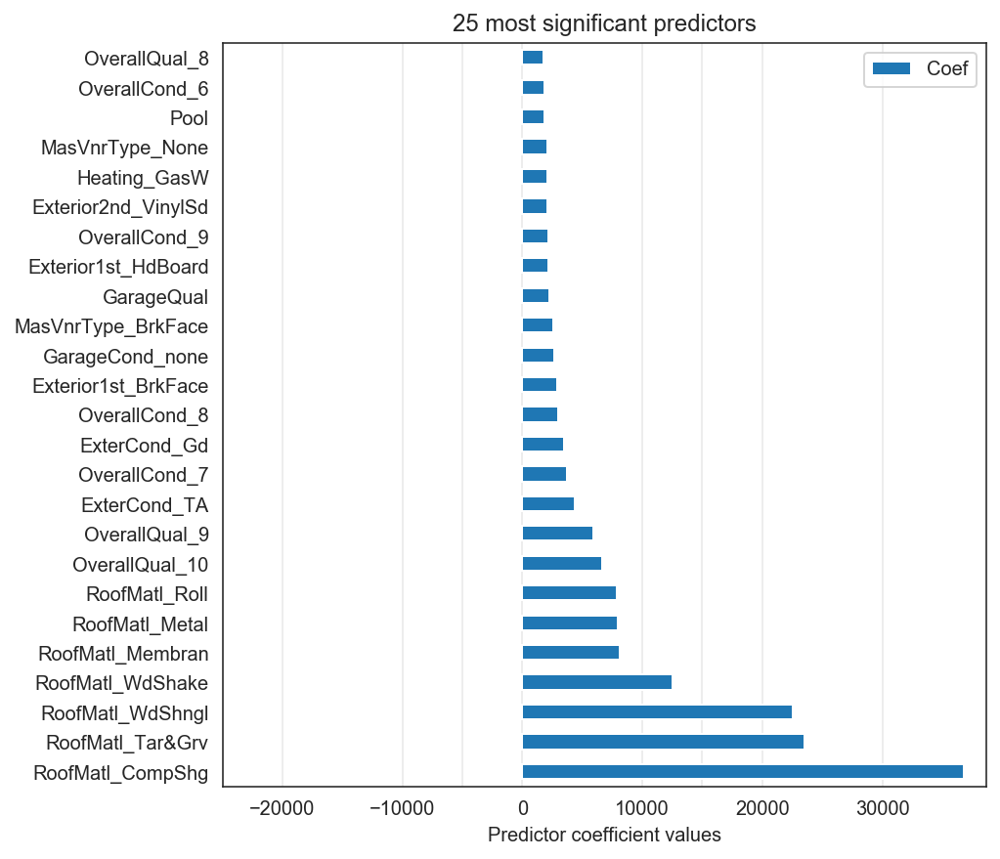

In [442]:
fig, ax = plt.subplots(figsize=(7,7))
title = '25 most significant predictors'
top25.plot(kind='barh', ax=ax)
ax.set_yticklabels(top25['Feature'])
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 20000), minor=True)
plt.show()

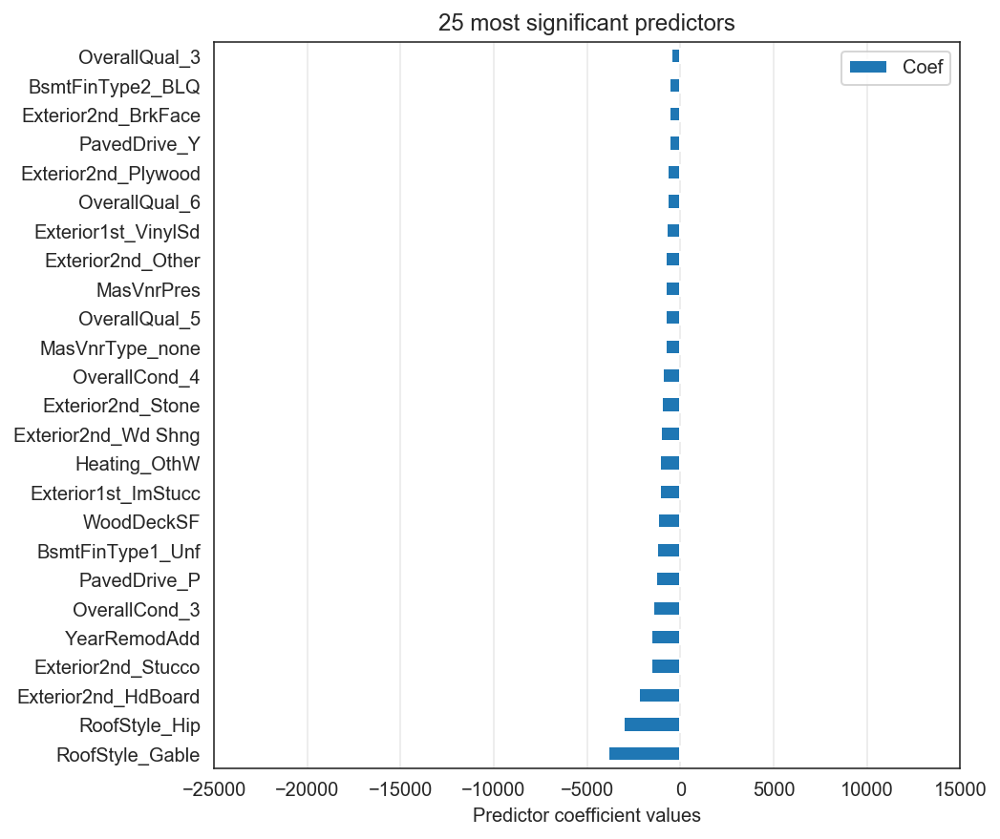

In [443]:
fig, ax = plt.subplots(figsize=(7,7))
title = '25 most significant predictors'
bottom25.plot(kind='barh', ax=ax)
ax.set_yticklabels(bottom25['Feature'])
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 20000), minor=True)
plt.show()

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. I recommend doing some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [444]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier

In [445]:
X=new_df.drop('SaleCondition', axis=1)
y=new_df[['SaleCondition']]

In [447]:
X=pd.get_dummies(X, drop_first =True)

In [448]:
y = new_df['SaleCondition'].apply(lambda x: 1 if x == 'Abnorml' else 0)

In [449]:
y.value_counts()

0    1354
1      96
Name: SaleCondition, dtype: int64

In [450]:
1354/96

14.104166666666666

In [451]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

In [466]:
params = {
        'min_child_weight': 1,
        'gamma': 0.5,
        'subsample': 0.6,
        'colsample_bytree':0.8,
        'max_depth': 3,
        'num_class': 2
        }

In [467]:
model = XGBClassifier(objective='multi:softmax',**params)

In [462]:
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

In [468]:
# grid = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=5, scoring='roc_auc',verbose=1)

In [469]:
model.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.5,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, num_class=2, objective='multi:softmax',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.6, verbosity=1)

In [471]:
from sklearn.model_selection import RepeatedStratifiedKFold
# evaluate model
scores = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1)
# summarize performance
print('Mean ROC AUC: %.5f', np.mean(scores))

Mean ROC AUC: %.5f 0.49834861271325365


In [472]:
model.predict(X_test)
model.score(X_test,y_test)

0.9311064718162839

In [473]:
prob_abnormal_class = ((new_df['SaleCondition'] == 'Abnorml').sum()) / new_df['SaleCondition'].count()

In [474]:
prob_abnormal_class

0.06620689655172414

In [ ]:
#model is doing worse than random chance here will have to employ some upsampling techniques and model parameter tuning 
#to account fro class imbalance